In [1]:
import os
import math
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [2]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1686316 sha256=6829a2fe49d9d8c383dfa0f8d9f34105c013a77d40e73619e01366035bb60903
  Stored in directory: /tmp/pip-ephem-wheel-cache-9dum0ip8/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


In [3]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [4]:
def load_image_into_numpy_array(path):

  image_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(image_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  
  image__np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(image__np_with_annotations,
                                                      boxes,
                                                      classes,
                                                      scores,
                                                      category_index,
                                                      use_normalized_coordinates=True,
                                                      min_score_thresh=0.8)
  
  if image_name:
    plt.imsave(image_name, image__np_with_annotations)
  else:
    plt.imshow(image__np_with_annotations)

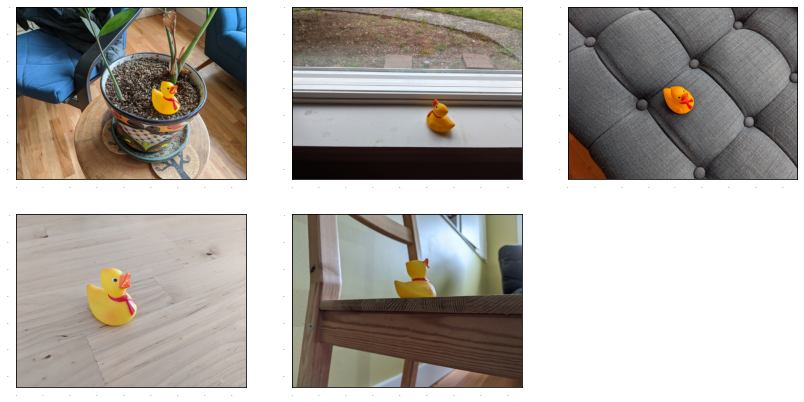

In [5]:
train_image_dir = '/content/models/research/object_detection/test_images/ducky/train/'
train_images_np = []

for i in range(1, 6):
  image_path = train_image_dir + f'robertducky{i}.jpg'
  train_images_np.append(load_image_into_numpy_array(image_path))
  
plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

for i, image_np in enumerate(train_images_np):
  plt.subplot(2, 3, i+1)
  plt.imshow(image_np)
  
plt.show()

In [6]:
gt_boxes = [
            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
]

In [7]:
duck_class_id = 1
num_classes = 1

category_index = {duck_class_id: {'id': duck_class_id, 'name': 'rubber_ducky'}}

label_id_offset = 1
train_image_tensors = []
gt_box_tensors = []
gt_classes_one_hot_tensors = []

for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))

  zero_indexed_gt_classes = tf.convert_to_tensor(np.ones(shape=gt_box_np.shape[0], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_gt_classes, num_classes))

print('Done!')

Done!


In [ ]:
# test_im_list = [f'out{i}.jpg' for i in range(1, 50)]
# random.shuffle(test_im_list)
# sample_of_test_images = test_im_list[:5]
# sample_of_test_images

['out19.jpg', 'out22.jpg', 'out3.jpg', 'out38.jpg', 'out10.jpg']

In [8]:
sample_of_test_images = ['out19.jpg', 'out22.jpg', 'out3.jpg', 'out38.jpg', 'out10.jpg']

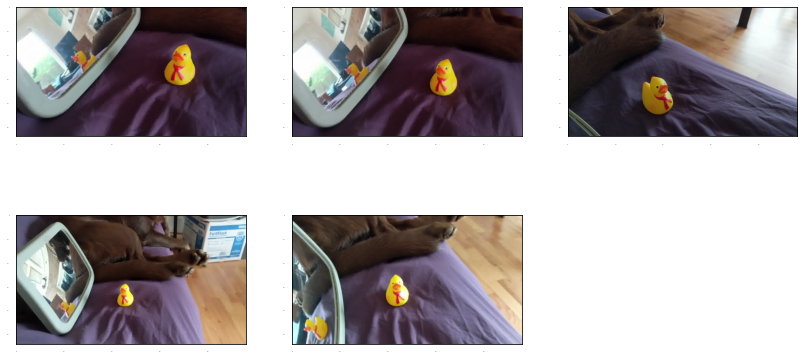

In [9]:
test_image_dir = '/content/models/research/object_detection/test_images/ducky/test/'
test_images_np = []


for image_name in sample_of_test_images:
  image_path = test_image_dir + image_name
  test_images_np.append(load_image_into_numpy_array(image_path))

for i, image_np in enumerate(test_images_np):
  plt.subplot(2, 3, i+1)
  plt.imshow(image_np)
  
plt.show()

In [ ]:
# test_gt_boxes = []
# colab_utils.annotate(test_images_np, box_storage_pointer=test_gt_boxes)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

In [ ]:
# test_gt_boxes

[array([[0.29106771, 0.64479167, 0.60440104, 0.778125  ],
        [0.34273437, 0.23854167, 0.51606771, 0.34479167]]),
 array([[0.40606771, 0.596875  , 0.68440104, 0.715625  ],
        [0.43773438, 0.22708333, 0.61440104, 0.33125   ]]),
 array([[0.53940104, 0.32083333, 0.83273438, 0.45416667]]),
 array([[0.53106771, 0.43958333, 0.70940104, 0.51041667],
        [0.66773437, 0.18645833, 0.80106771, 0.25416667]]),
 array([[0.46440104, 0.40833333, 0.70606771, 0.50416667],
        [0.78440104, 0.04895833, 0.96940104, 0.15      ]])]

In [10]:
test_gt_boxes = [np.array([[0.29106771, 0.64479167, 0.60440104, 0.778125  ],
                        [0.34273437, 0.23854167, 0.51606771, 0.34479167]]),
                 np.array([[0.40606771, 0.596875  , 0.68440104, 0.715625  ],
                        [0.43773438, 0.22708333, 0.61440104, 0.33125   ]]),
                 np.array([[0.53940104, 0.32083333, 0.83273438, 0.45416667]]),
                 np.array([[0.53106771, 0.43958333, 0.70940104, 0.51041667],
                        [0.66773437, 0.18645833, 0.80106771, 0.25416667]]),
                 np.array([[0.46440104, 0.40833333, 0.70606771, 0.50416667],
                        [0.78440104, 0.04895833, 0.96940104, 0.15      ]])]

In [11]:
label_id_offset = 1
test_image_tensors = []
test_gt_box_tensors = []
test_gt_classes_one_hot_tensors = []

for (test_image_np, test_gt_box_np) in zip(test_images_np, test_gt_boxes):
  test_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(test_image_np, dtype=tf.float32), axis=0))
  test_gt_box_tensors.append(tf.convert_to_tensor(test_gt_box_np, dtype=tf.float32))

  zero_indexed_gt_classes = tf.convert_to_tensor(np.ones(shape=test_gt_box_np.shape[0], dtype=np.int32) - label_id_offset)
  test_gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_gt_classes, num_classes))

print('Done!')

Done!


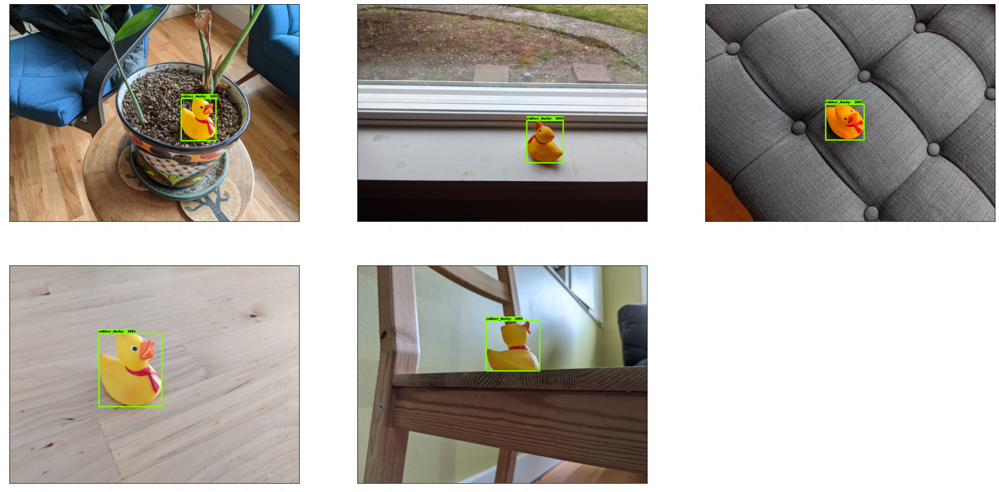

In [12]:
dummy_score = np.array([1.0], dtype=np.float32)

plt.figure(figsize=(30, 15))
for i in range(5):
  plt.subplot(2, 3, i+1)
  plot_detections(
      train_images_np[i],
      gt_boxes[i],
      np.ones(shape=gt_boxes[i].shape[0], dtype=np.int32),
      dummy_score,
      category_index
  )

plt.show()

In [13]:
train_image_dir = '/content/models/research/object_detection/test_images/ducky/train/'
train_images_dirs = []

for i in range(1, 6):
  image_path = train_image_dir + f'robertducky{i}.jpg'
  train_images_dirs.append(image_path)

train_labels = np.ones(len(train_images_dirs), dtype=np.int32)

In [14]:
test_image_dir = '/content/models/research/object_detection/test_images/ducky/test/'
test_images_dirs = []


for image_name in sample_of_test_images:
  image_path = test_image_dir + image_name
  test_images_dirs.append(image_path)

test_labels = np.ones(len(test_images_dirs), dtype=np.int32)

In [15]:
train_ds = tf.data.Dataset.from_tensor_slices((train_images_dirs, (gt_boxes, train_images_dirs)))
test_ds = tf.data.Dataset.from_tensor_slices((test_images_dirs, (tf.ragged.constant(test_gt_boxes), test_labels)))

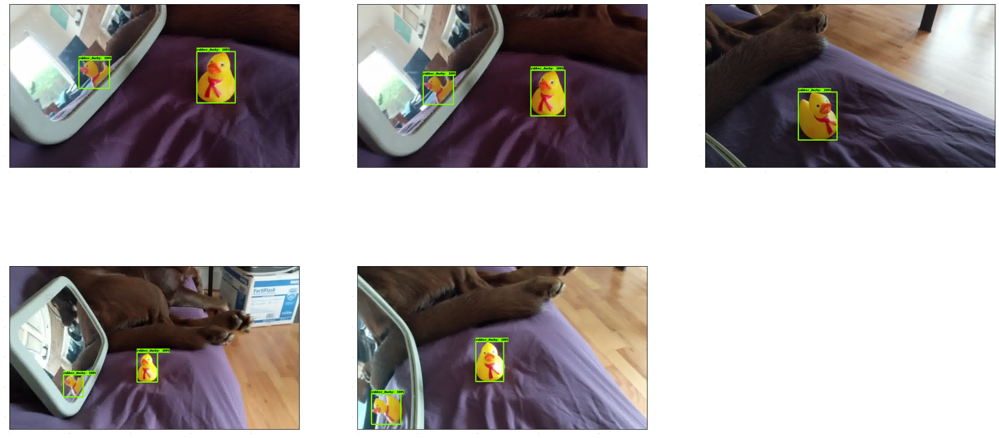

In [16]:
# display some of the test images with their bboxes (here we display all)
plt.figure(figsize=(30, 15))
for i in range(5):
  plt.subplot(2, 3, i+1)
  plot_detections(
      test_images_np[i],
      test_gt_boxes[i],
      np.ones(shape=test_gt_boxes[i].shape[0], dtype=np.int32),
      np.ones(shape=test_gt_boxes[i].shape[0], dtype=np.float32),
      category_index
  )

plt.show()

In [17]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2022-02-06 19:51:03--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.202.128, 2607:f8b0:400e:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.202.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   364MB/s    in 0.6s    

2022-02-06 19:51:04 (364 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [35]:
tf.keras.backend.clear_session()

print("Building model and restoring weights for fine-tuning...")
pipeline_config = '/content/models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = '/content/models/research/object_detection/test_data/checkpoint/ckpt-0'

num_classes = 1
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(model_config=model_config, is_training=True)

fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
)

fake_model = tf.compat.v2.train.Checkpoint(
    _feature_extractor=detection_model._feature_extractor,
    _box_predictor=fake_box_predictor
)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Done prepping data.')

Building model and restoring weights for fine-tuning...


UnimplementedError: ignored

In [30]:
tf.zeros([2, 640, 640, 3]).shape

TensorShape([2, 640, 640, 3])

In [ ]:
batch_size = 4
learning_rate = 0.01
EPOCHS = 150
num_batches_per_epoch = math.ceil(len(train_image_tensors)/batch_size)
num_batches_per_test_epoch = math.ceil(len(test_image_tensors)/batch_size)

trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']

for var in trainable_variables:
  if any(var.name.startswith(prefix) for prefix in prefixes_to_train):
    to_fine_tune.append(var)

def get_model_train_step_function(model, optimizer, vars_to_fine_tune):

  @tf.function
  def train_step_fn(image_tensors, gt_boxes_list, gt_classes_list):
    shapes = tf.constant(len(image_tensors) * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=gt_boxes_list,
        groundtruth_classes_list=gt_classes_list)
    
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat([detection_model.preprocess(image_tensor)[0] for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

In [ ]:
def get_model_test_step_function(model):

  @tf.function
  def test_step_fn(image_tensors, gt_boxes_list, gt_classes_list):
    shapes = tf.constant(len(image_tensors) * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=gt_boxes_list,
        groundtruth_classes_list=gt_classes_list)
    
    preprocessed_images = tf.concat([detection_model.preprocess(image_tensor)[0] for image_tensor in image_tensors], axis=0)
    prediction_dict = model.predict(preprocessed_images, shapes)
    losses_dict = model.loss(prediction_dict, shapes)
    total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
    return total_loss
  return test_step_fn

In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
check_point = tf.compat.v2.train.Checkpoint(
      model=detection_model, optimizer=optimizer)
manager = tf.compat.v2.train.CheckpointManager(
            check_point, 'checkpoints/ssd_best_model_custom/', max_to_keep=1)

In [ ]:
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

test_step_fn = get_model_test_step_function(detection_model)
best_valiation_loss = np.inf

def preprocess_image(file_path, labels):
  image = tf.io.read_file(file_path)
  image = tf.image.decode_jpeg(image)
  return image, labels

print('Start fine-tuning!', flush=True)
for epoch in range(EPOCHS):
  tf_train_dataset = train_ds.map(preprocess_image).shuffle(len(train_ds)).batch(batch_size).prefetch(-1).cache()
  total_loss = 0
  

  for image_tensors, (gt_bbox_tensors, gt_label_tensors) in tf_train_dataset:

    image_tensors_list = []
    for image_tensor in image_tensors:
      image_tensors_list.append(tf.cast(tf.expand_dims(image_tensor, axis=0), dtype=tf.float32))

    gt_bboxes_list = []
    aa = gt_bbox_tensors.numpy().tolist()
    for bboxes in aa:
      bbox_array = np.zeros((len(bboxes), 4), dtype=np.float32)
      for i, bbox in enumerate(bboxes):
        bbox_array[i, :] += bbox
      gt_bboxes_list.append(tf.convert_to_tensor(bbox_array))

    gt_classes_list = []
    for boxes in gt_bboxes_list:
      gt_classes_list.append(tf.convert_to_tensor(np.ones((boxes.shape[0], 1), dtype=np.float32)))

    # Training step (forward pass + backwards pass)
    total_loss += train_step_fn(image_tensors_list, gt_bboxes_list, gt_classes_list) * len(image_tensors)

  tf_test_dataset = test_ds.map(preprocess_image).batch(batch_size).prefetch(-1).cache()
  test_total_loss = 0
  for image_tensors, (gt_bbox_tensors, gt_label_tensors) in tf_test_dataset:

    image_tensors_list = []
    for image_tensor in image_tensors:
      image_tensors_list.append(tf.cast(tf.expand_dims(image_tensor, axis=0), dtype=tf.float32))

    gt_bboxes_list = []
    aa = gt_bbox_tensors.numpy().tolist()
    for bboxes in aa:
      bbox_array = np.zeros((len(bboxes), 4), dtype=np.float32)
      for i, bbox in enumerate(bboxes):
        bbox_array[i, :] += bbox
      gt_bboxes_list.append(tf.convert_to_tensor(bbox_array))

    gt_classes_list = []
    for boxes in gt_bboxes_list:
      gt_classes_list.append(tf.convert_to_tensor(np.ones((boxes.shape[0], 1), dtype=np.float32)))

    # Training step (forward pass + backwards pass)
    test_total_loss += test_step_fn(image_tensors_list, gt_bboxes_list, gt_classes_list) * len(image_tensors)

  if test_total_loss < best_valiation_loss:
    best_valiation_loss = test_total_loss
    manager.save()

  print(f'Epoch {epoch+1} ----------> Total Train Loss : {total_loss/len(train_image_tensors)} , Total Validation Loss : {test_total_loss/len(test_image_tensors)}')

print('Done fine-tuning!')

In [ ]:
tf.keras.backend.clear_session()

print("Restoring the Best Model from the Checkpoint")
# use the pipeline of the same model you used for training
pipeline_config = '/content/models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
# this a different checkpoint than the one you restored the weights from first. This is the one you used as a checkpoint during training
checkpoint_path = '/content/checkpoints/ssd_best_model_custom/ckpt-1'

num_classes = 1
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = False
detection_model = model_builder.build(model_config=model_config, is_training=False)

ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(checkpoint_path).expect_partial()

# pass a fake image to restore the parameters
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Done prepping data.')

Restoring the Best Model from the Checkpoint
Done prepping data.


In [ ]:
test_step_fn = get_model_test_step_function(detection_model)
test_total_loss = 0
for batch in range(num_batches_per_test_epoch):
  all_keys = list(range(len(test_images_np)))
  try:
    keys = all_keys[batch_size*batch: batch_size*(batch+1)]
  except:
    keys = all_keys[batch_size*batch:]

  test_gt_boxes_list = [test_gt_box_tensors[key] for key in keys]
  test_gt_classes_list = [test_gt_classes_one_hot_tensors[key] for key in keys]
  test_images_tensors = [test_image_tensors[key] for key in keys]

  # Training step (forward pass + backwards pass)
  test_total_loss += test_step_fn(test_images_tensors, test_gt_boxes_list, test_gt_classes_list) * len(keys)

print("Total validation loss =", test_total_loss)

Total validation loss = tf.Tensor(4.0554943, shape=(), dtype=float32)


In [ ]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

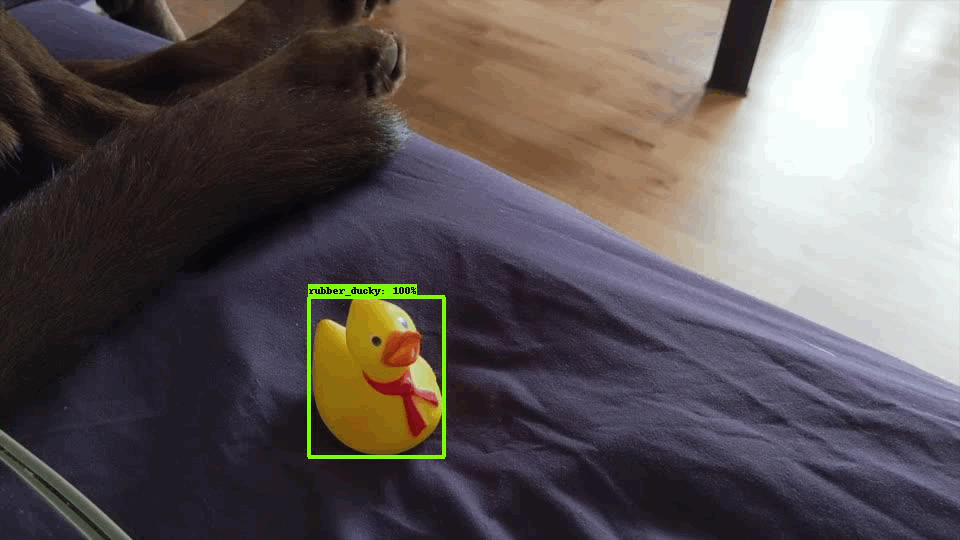

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)

display(IPyImage(open(anim_file, 'rb').read()))